# Read and Analyze AlphaFold2-Multimer Outputs

https://colab.research.google.com/github/sokrypton/ColabFold/blob/main/batch/AlphaFold2_batch.ipynb

1. Run AlphaFold2-Multimer
2. Downlaod ZIP files from Google Drive
3. Place ZIP files in the defined folder
4. Run Script

## Imports

In [11]:
%pip install -q numpy pandas matplotlib py3Dmol openpyxl

Note: you may need to restart the kernel to use updated packages.


In [12]:
import zipfile
import json
import py3Dmol
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from IPython.display import display, HTML

## Configuration

In [13]:
class Config:
    AF_DIR = "AlphaFold"
    CANDIDATE_NUM = "001"

config = Config()

dir = Path(config.AF_DIR)
if not dir.exists():
    print(f"Creating directory: {dir}")
    dir.mkdir()

print(f"Searching for ColabFold .zip outputs in: {dir}")

# Find all zip files in the directory
zip_files = list(dir.glob("*.zip"))

if not zip_files:
    print("\nERROR: No .zip files found in the validation directory.")
    print("Please make sure to place your ColabFold outputs there before running this cell.")
else:
    print(f"Found {len(zip_files)} candidate zip files to analyze.")

Searching for ColabFold .zip outputs in: AlphaFold
Found 6 candidate zip files to analyze.


## Data Analysis


--- Confidence Scores ---
Interface pTM (ipTM): 0.8400
Interpretation: Low confidence binding prediction.
Mean pLDDT: 68.71 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


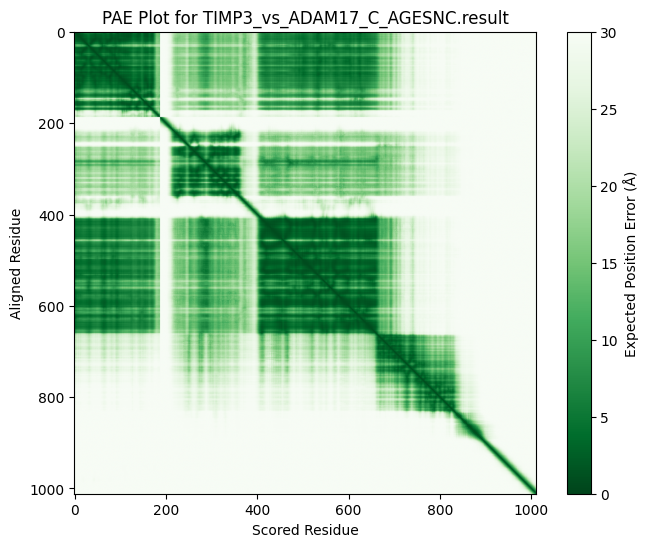


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.


--- Confidence Scores ---
Interface pTM (ipTM): 0.8700
Interpretation: High confidence binding prediction.
Mean pLDDT: 69.09 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


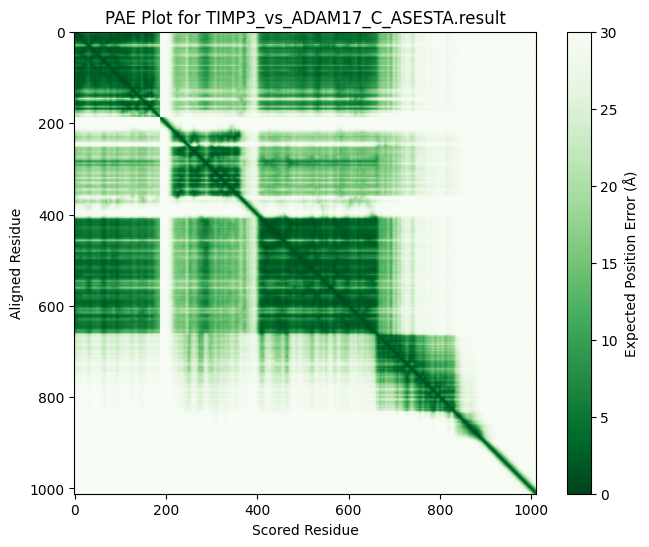


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.


--- Confidence Scores ---
Interface pTM (ipTM): 0.8800
Interpretation: High confidence binding prediction.
Mean pLDDT: 66.19 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


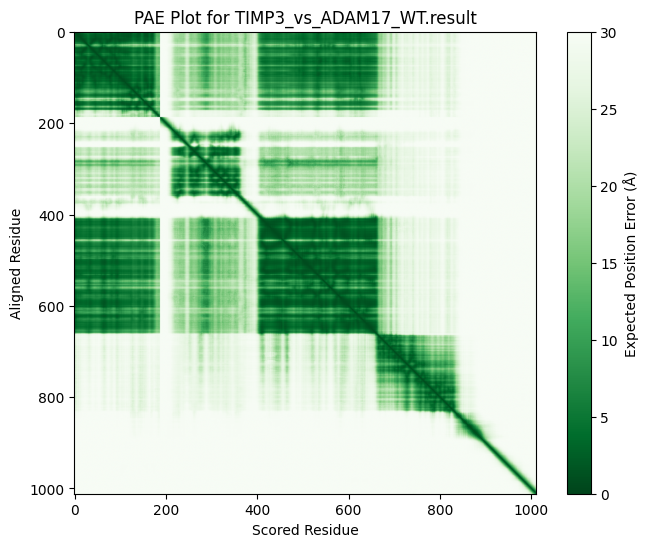


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.


--- Confidence Scores ---
Interface pTM (ipTM): 0.8300
Interpretation: Low confidence binding prediction.
Mean pLDDT: 79.18 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


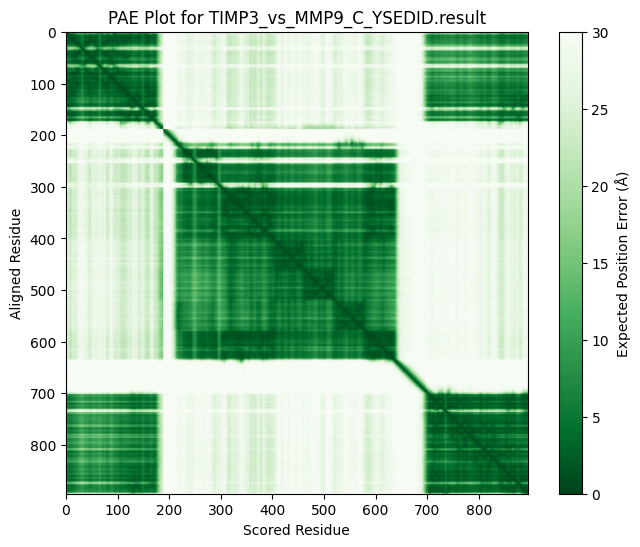


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.


--- Confidence Scores ---
Interface pTM (ipTM): 0.8400
Interpretation: Low confidence binding prediction.
Mean pLDDT: 77.87 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


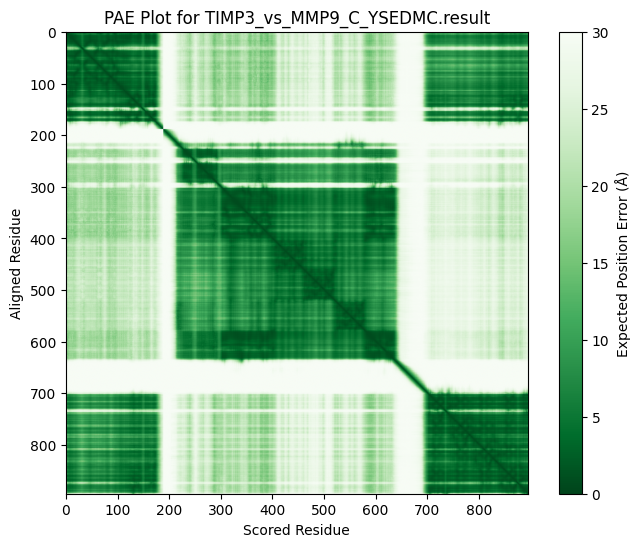


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.


--- Confidence Scores ---
Interface pTM (ipTM): 0.8400
Interpretation: Low confidence binding prediction.
Mean pLDDT: 78.93 (Overall structure confidence)

--- Predicted Aligned Error (PAE) Plot ---


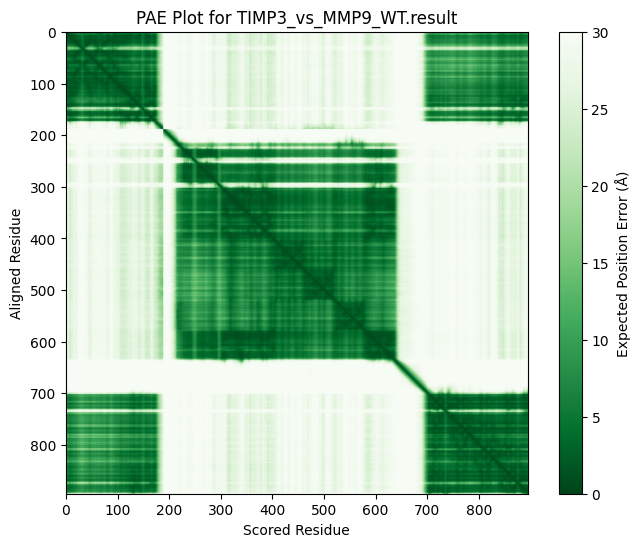


--- Predicted 3D Structure (Colored by pLDDT) ---


3Dmol.js failed to load for some reason. Please check your browser console for error messages.

In [ ]:
import shutil

results_list = []

# --- 2. LOOP THROUGH EACH ZIP FILE AND ANALYZE ---
for zip_file_path in sorted(zip_files):
    candidate_name = zip_file_path.stem
    display(HTML(f"<hr><h2>Analyzing Candidate: {candidate_name}</h2>"))
    
    # Unzip the contents into a subdirectory
    unzip_dir = dir / candidate_name
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(unzip_dir)
    
    # Find the files for the top-ranked model (rank 1)
    try:
        scores_file = next(unzip_dir.glob(f"*_scores_rank_{config.CANDIDATE_NUM}_*.json"))
        pae_file = next(unzip_dir.glob("*_predicted_aligned_error_v1.json"))
        pdb_file = next(unzip_dir.glob(f"*_unrelaxed_rank_{config.CANDIDATE_NUM}_*.pdb"))
    except StopIteration:
        print(f"WARNING: Could not find all required output files for rank 1 in {candidate_name}. Skipping.")
        continue

    # --- EXTRACT AND DISPLAY KEY SCORES ---
    with open(scores_file, 'r') as f:
        scores_data = json.load(f)
    
    ipTM_score = scores_data.get("iptm")
    mean_plddt = np.mean(scores_data.get("plddt", [0]))
    
    results_list.append({
        "Candidate": candidate_name,
        "ipTM": ipTM_score,
        "Mean pLDDT": mean_plddt
    })

    print("\n--- Confidence Scores ---")
    if ipTM_score is not None:
        print(f"Interface pTM (ipTM): {ipTM_score:.4f}")
        if ipTM_score > 0.85:
            print("Interpretation: High confidence binding prediction.")
        else:
            print("Interpretation: Low confidence binding prediction.")
    
    if mean_plddt > 0:
            print(f"Mean pLDDT: {mean_plddt:.2f} (Overall structure confidence)")
    
    # --- PLOT THE PAE MATRIX FROM RAW JSON DATA ---
    with open(pae_file, 'r') as f:
        pae_data = json.load(f)
    
    pae_matrix = pae_data.get('predicted_aligned_error')
    if pae_matrix:
        print("\n--- Predicted Aligned Error (PAE) Plot ---")
        plt.figure(figsize=(8, 6))
        plt.imshow(pae_matrix, cmap='Greens_r', vmin=0, vmax=30)
        plt.colorbar(label="Expected Position Error (Å)")
        plt.title(f"PAE Plot for {candidate_name}")
        plt.xlabel("Scored Residue")
        plt.ylabel("Aligned Residue")
        plt.savefig(dir / f"PAE_{candidate_name}_{config.CANDIDATE_NUM}.png")
        plt.show()
        plt.close()
    
    # --- VISUALIZE THE 3D STRUCTURE ---
    print("\n--- Predicted 3D Structure (Colored by pLDDT) ---")
    with open(pdb_file, 'r') as f:
        pdb_data = f.read()

    view = py3Dmol.view(width=800, height=600)
    view.addModel(pdb_data, "pdb")
    view.setStyle({'cartoon': {'colorscheme': {
        'prop': 'b', 'gradient': 'roygb', 'min': 40, 'max': 100,
    }}})
    view.zoomTo()
    view.show()

    shutil.rmtree(unzip_dir)  # Clean up the unzipped directory
    print(f"Cleaned up temporary files for candidate: {candidate_name}")

## Save Summary

In [15]:
# --- FINAL SUMMARY ---
if results_list:
    display(HTML("<hr><h1>Final Summary Ranking</h1>"))
    summary_df = pd.DataFrame(results_list)
    summary_df_sorted = summary_df.sort_values(by="ipTM", ascending=False).reset_index(drop=True)
    
    # Style the dataframe for better readability
    styled_summary_df = summary_df_sorted.style.background_gradient(subset=['ipTM'], cmap='viridis').format({'ipTM': '{:.4f}', 'Mean pLDDT': '{:.2f}'})
    styled_summary_df = styled_summary_df.background_gradient(subset=['Mean pLDDT'], cmap='viridis')
    display(styled_summary_df)
    
    styled_summary_df.to_excel(dir / 'AlphaFold_Summary.xlsx', engine='openpyxl', index=False)
    latex_table = styled_summary_df.hide(axis="index").to_latex(caption=f"AlphaFold2-multimer Summary", label=f"tab:af2_multi_sum", convert_css=True)
    latex_table = latex_table.replace("_", " ").replace(".result", "")
    with open(dir / f"AlphaFold_Summary.tex", 'w', encoding='utf-8') as f:
        f.write(latex_table)

,Candidate,ipTM,Mean pLDDT
0,TIMP3_vs_ADAM17_WT.result,0.8800,66.19
1,TIMP3_vs_ADAM17_C_ASESTA.result,0.8700,69.09
2,TIMP3_vs_ADAM17_C_AGESNC.result,0.8400,68.71
3,TIMP3_vs_MMP9_C_YSEDMC.result,0.8400,77.87
4,TIMP3_vs_MMP9_WT.result,0.8400,78.93
5,TIMP3_vs_MMP9_C_YSEDID.result,0.8300,79.18
